# Imports and Setup

In [1]:
# %%capture
# !pip -q install --upgrade folium
# !apt install libspatialindex-dev
# !pip -q install rtree
# !pip -q install geopandas
# !pip -q install geojson
# !pip -q install geemap
# !pip -q uninstall tornado -y
# !yes | pip install tornado==5.1.0
# !pip -q install rasterio
# !pip -q install tqdm
# !pip -q install eeconvert

In [2]:
# Standard imports
from tqdm.notebook import tqdm
import requests
import json

import pandas as pd
import numpy as np
from PIL import Image

# Geospatial processing packages
import geopandas as gpd
import geojson

import shapely
import rasterio as rio
from rasterio.plot import show
import rasterio.mask
from shapely.geometry import box

# Mapping and plotting libraries
import matplotlib.pyplot as plt
import matplotlib.colors as cl
import ee
import eeconvert as eec
import geemap
# import geemap.eefolium as emap
import folium

# Deep learning libraries
import torch
from torchvision import datasets, models, transforms

In [3]:
from utils2 import *

### Authenticate Google Earth Engine
Make sure you have signed up for access to Google Earth Engine at https://signup.earthengine.google.com/#!/. Once your request has been approved, you should be able to access Google Earth Engine at https://code.earthengine.google.com/.

In [4]:
ee.Authenticate()
ee.Initialize()

<a name="admin-bounds"></a>
# Download Country Boundaries

Our first step is to download the administrative boundaries of our country of interest, which we will obtain via [geoBoundaries by the William and Mary GeoLab](https://www.geoboundaries.org/index.html). geoBoundaries is a free and openly accessible global database of political administrative boundaries for every country in the world. The geographic boundaries can be downloaded via API access through a simple query:

```
https://www.geoboundaries.org/gbRequest.html?ISO=[3-LETTER-ISO-CODE]&ADM=[ADM-LEVEL]
```
- **ISO** - The three-letter ISO code representing the country of interest.
  - [See this page](https://en.wikipedia.org/wiki/List_of_ISO_3166_country_codes) for the complete list of ISO codes per country.
- **ADM** - One of ADM0, ADM1, ADM2, ADM3, ADM4 or ADM5, representing each level of administrative hierarchy.

For more information, see [API documentation](https://www.geoboundaries.org/api.html).



### Flevoland in Netherlands

In [5]:
import requests, time, geojson
import geopandas as gpd

ISO = 'NLD'      # 3-letter code
ADM = 'ADM1'     # administrative level
api_url = f"https://www.geoboundaries.org/api/current/gbOpen/{ISO}/{ADM}/"

start = time.time()
r = requests.get(api_url)

r.raise_for_status()
data = r.json()
assert len(data) > 0, "No boundaries returned!"


In [6]:
data

{'boundaryID': 'NLD-ADM1-6811986',
 'boundaryName': 'Netherlands',
 'boundaryISO': 'NLD',
 'boundaryYearRepresented': '2022',
 'boundaryType': 'ADM1',
 'boundaryCanonical': 'Province',
 'boundarySource': 'National Georegister',
 'boundaryLicense': 'CC0 1.0 Universal (CC0 1.0) Public Domain Dedication',
 'licenseDetail': 'nan',
 'licenseSource': 'nationaalgeoregister.nl/geonetwork/srv/dut/catalog.search#/metadata/208bc283-7c66-4ce7-8ad3-1cf3e8933fb5?tab=general',
 'boundarySourceURL': 'nationaalgeoregister.nl/geonetwork/srv/dut/catalog.search#/metadata/208bc283-7c66-4ce7-8ad3-1cf3e8933fb5?tab=relations',
 'sourceDataUpdateDate': 'Thu Jan 19 07:31:04 2023',
 'buildDate': 'Dec 12, 2023',
 'Continent': 'Europe',
 'UNSDG-region': 'Europe and Northern America',
 'UNSDG-subregion': 'Western Europe',
 'worldBankIncomeGroup': 'High-income Countries',
 'admUnitCount': '12',
 'meanVertices': '11746.0',
 'minVertices': '1059',
 'maxVertices': '21380',
 'meanPerimeterLengthKM': '501.7096427551171',

In [7]:
dl_url = data['gjDownloadURL']
print("GeoJSON URL:", dl_url)

filename = 'geoboundary.geojson'
geojson_data = requests.get(dl_url).json()

with open(filename, 'w') as f:
    geojson.dump(geojson_data, f)

print("Saved to", filename)

# Load in GeoPandas
gdf = gpd.read_file(filename)
print("Data dimensions:", gdf.shape)
gdf

GeoJSON URL: https://github.com/wmgeolab/geoBoundaries/raw/9469f09/releaseData/gbOpen/NLD/ADM1/geoBoundaries-NLD-ADM1.geojson
Saved to geoboundary.geojson
Data dimensions: (12, 6)


,shapeName,shapeISO,shapeID,shapeGroup,shapeType,geometry
0,Groningen,NL-GR,6811986B22599492826393,NLD,ADM1,"POLYGON ((6.31516 53.09405, 6.31551 53.09397, ..."
1,Drenthe,NL-DR,6811986B35805836723247,NLD,ADM1,"POLYGON ((6.31516 53.09405, 6.31495 53.09378, ..."
2,Utrecht,NL-UT,6811986B73841275384957,NLD,ADM1,"POLYGON ((5.02691 51.85861, 5.0271 51.85863, 5..."
3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,"POLYGON ((5.40464 52.24963, 5.40673 52.24975, ..."
4,Overijssel,NL-OV,6811986B65865334514334,NLD,ADM1,"POLYGON ((6.11982 52.85422, 6.1198 52.85421, 6..."
5,Noord-Holland,NL-NH,6811986B7118592816602,NLD,ADM1,"POLYGON ((5.33546 52.29022, 5.31747 52.30112, ..."
6,Gelderland,NL-GE,6811986B62088949697264,NLD,ADM1,"POLYGON ((5.02691 51.85861, 5.02652 51.8586, 5..."
7,Zuid-Holland,NL-ZH,6811986B20589914738510,NLD,ADM1,"POLYGON ((4.79458 52.22673, 4.794 52.22681, 4...."
8,Fryslân,NL-FR,6811986B16797155540126,NLD,ADM1,"POLYGON ((6.35253 53.53971, 6.3373 53.5331, 6...."
9,Noord-Brabant,NL-NB,6811986B61109061302483,NLD,ADM1,"MULTIPOLYGON (((5.00036 51.82093, 5.00013 51.8..."


In this example, we visualize the adminstrative boundary for Province **Flevoland** using the GeoPandas `.plot()` function.

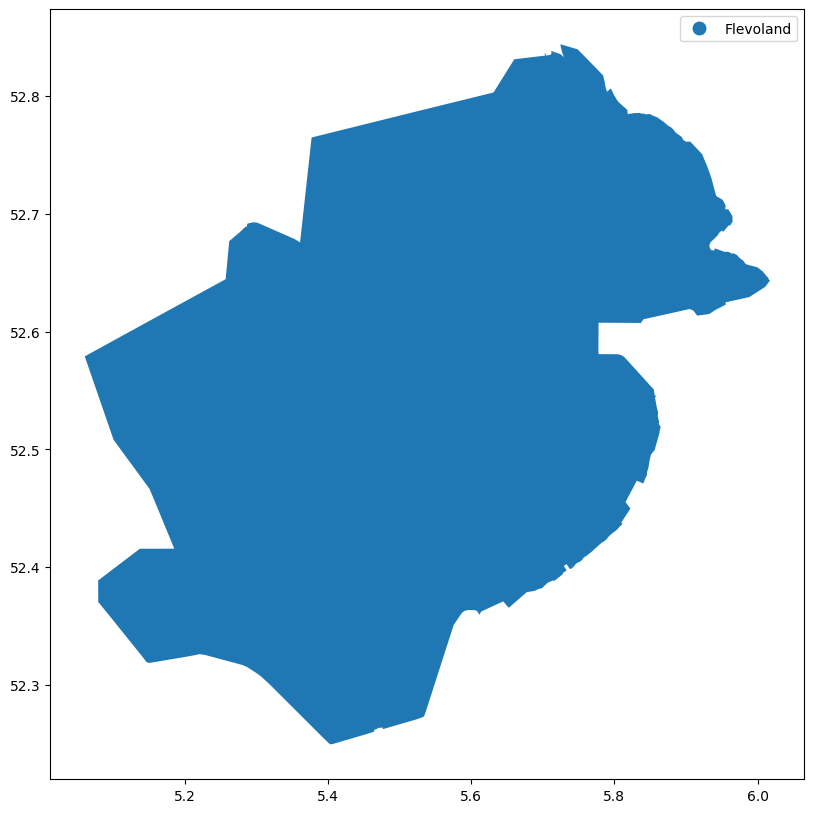

In [8]:
# shape_name = 'Kreis Borken'
# fig, ax = plt.subplots(1, figsize=(10,10))
# geoboundary[geoboundary.shapeName == shape_name].plot('shapeName', legend=True, ax=ax);

shape_name = 'Flevoland'
fig, ax = plt.subplots(1, figsize=(10,10))
gdf[gdf.shapeName == shape_name].plot('shapeName', legend=True, ax=ax);

<a name="sentinel-2"></a>
# Generate Sentinel-2 Satellite Images
Sentinel-2 is an Earth observation mission from the Copernicus Programme that provides global multispectral imagery every 10 days (2015 - present) at 10 m resolution (i.e. the length of one side of a pixel is equal to 10 meters).

Images are typically composed of 3 channels or bands: red, green, and blue. Sentinel-2, on the other hand, is able to capture 13 spectral bands:
- 4 bands at 10 meter: blue, green, red, and near-infrared
- 6 bands at 20 meter: for vegetation characterization and for applications such as snow/ice/cloud detection or vegetation moisture stress assessment.
- 3 bands at 60 meter: mainly for cloud screening and atmospheric corrections


&nbsp; &nbsp; &nbsp; &nbsp;<img src="https://www.researchgate.net/profile/Gordana_Jovanovska_Kaplan/publication/314119510/figure/tbl1/AS:670480428195846@1536866399263/Sentinel-2-band-characteristics.png" width="400"/>

For simplicity, we only used the Red, Green, and Blue bands for LULC classification in this tutorial. However, multispectral data contains rich information that can be useful for a number of applications including crop yield estimation, vegetation health monitoring, built-up area expansion analysis, informal settlement detection, and so much more. We highly encourage you to explore the full potential of Sentinel-2 satellite imagery for climate-related applications.

[Learn more about Sentinel-2 here](https://www.usgs.gov/centers/eros/science/usgs-eros-archive-sentinel-2?qt-science_center_objects=0#qt-science_center_objects).



## Google Earth Engine
In this section, we will demonstrate how to use Google Engine to download Sentinel-2 satellite imagery. Again, for simplicity, we will only download Sentinel-2 RGB bands - red (B4), green (B3), and blue (B2).

In the following cell, we define a function to generate a Sentinel-2 image from Google Earth using the Python Earth Engine API. In order to minimize cloud cover, we chose to aggregate a collection of images over a period of time, as opposed to obtaining a single image on a given date.

In [9]:
from utils2 import generate_image

We generate and visualize the Sentinel-2 satellite image for Flevoland. The satellite image is generated by getting the median of all Sentinel-2 images in 2021 with a cloud cover of less than 10%.

In [10]:
# Get the shape geometry for Flevoland
region  = gdf.loc[gdf.shapeName == shape_name]
centroid = region.iloc[0].geometry.centroid.coords[0]
region = eec.gdfToFc(region) #geodataframe to feature collection

# Generate RGB image using GEE
image = generate_image(
    region,
    product='COPERNICUS/S2_SR_HARMONIZED', # Harmonised Sentinel-2A
    min_date='2021-01-01', # Get all images within
    max_date='2021-12-31', # the year 2021
    cloud_pct=10, # Filter out images with cloud cover >= 10.0%
)

# Visualize map
Map = geemap.Map(center=[centroid[1], centroid[0]], zoom=10)
Map.addLayer(image, {}, 'S2_SR_HARMONIZED')
Map.addLayerControl()
Map

Map(center=[52.55038227751801, 5.5151625712573855], controls=(WidgetControl(options=['position', 'transparent_…

## Export Image to Local Gdrive
In the following cell, we define a function to export our generated Sentinel-2 satellite image to our local Google Drive.

We can now proceed to download the image to our local Google Drive as a GeoTIFF.

**Note**: Be careful about exporting large images as they can take a while to download and could eat up storage space!

In [11]:
folder = 'Colab Notebooks' # Change this to your file destination folder in Google drive
task = export_image(image, shape_name, region, folder)

Exporting to Flevoland.tif ...


You can repeatedly run `task.status()` to monitor the state of the task. After a while, the state should change from "READY" to "RUNNING" to "COMPLETE".

Alternatively, you can go to https://code.earthengine.google.com/ to check the status of the task.

In [12]:
task.status()

{'state': 'READY',
 'description': 'Flevoland',
 'priority': 100,
 'creation_timestamp_ms': 1756403709013,
 'update_timestamp_ms': 1756403709013,
 'start_timestamp_ms': 0,
 'task_type': 'EXPORT_IMAGE',
 'id': 'OB4CQAMRCJ42MLURK4TDXDQH',
 'name': 'projects/415230773355/operations/OB4CQAMRCJ42MLURK4TDXDQH'}

## Visualize Harmonized Sentinel-2 Image

You can download locally the image we just saved on google drive to facilitate the work

In the following cell, we load and visualize the satellite raster image using the Rasterio library.

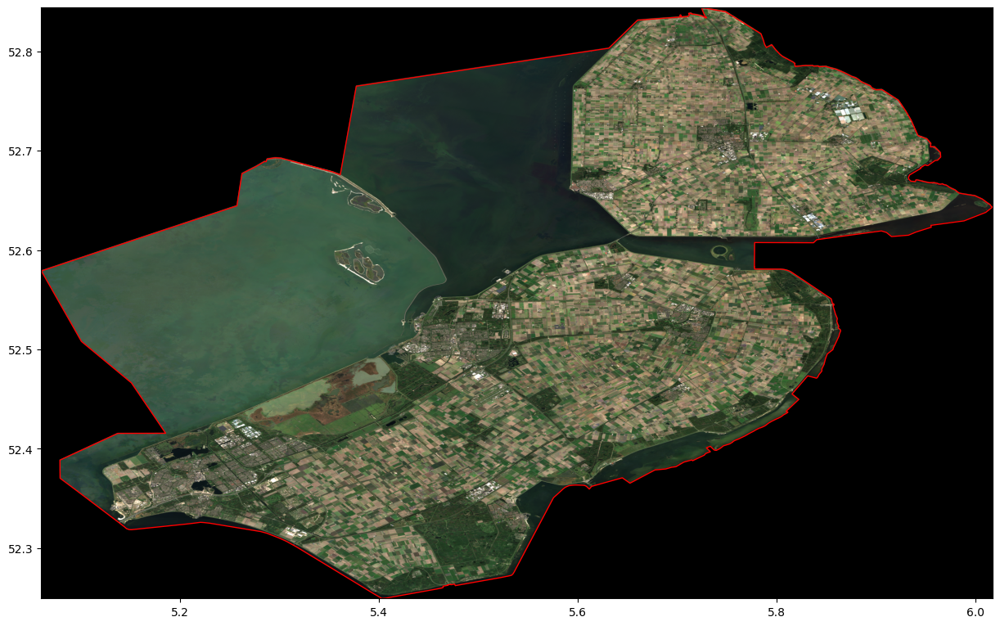

In [13]:
# Change this to your image file path
inference_path = './data/Inference/'

tif_file = inference_path + '{}.tif'.format(shape_name)

# Open image file using Rasterio
image = rio.open(tif_file)
boundary = gdf[gdf.shapeName == shape_name]

# Plot image and corresponding boundary
fig, ax = plt.subplots(figsize=(15,15))
boundary.plot(facecolor="none", edgecolor='red', ax=ax)
show(image, ax=ax);

<a name="tiles"></a>
# Generate 64x64 px GeoJSON Tiles

Remember that in previous tutorial, we trained a deep learning model on the [EuroSAT RGB dataset](), which consists of 64x64 pixel Sentinel-2 image patches. This means that we will also need to break down our huge Sentinel-2 image into smaller 64x64 px tiles.

Let's start by creating a function that generates a grid of 64x64 px square polygons using [Rasterio Window utilities](https://rasterio.readthedocs.io/en/latest/api/rasterio.windows.html). (find the function in utils2.py file)

In [14]:
generate_tiles?

Signature: generate_tiles(image_file, output_file, area_str, size=64)
Docstring:
Generates 64 x 64 polygon tiles.

Args:
  image_file (str): Image file path (.tif)
  output_file (str): Output file path (.geojson)
  area_str (str): Name of the region
  size(int): Window size

Returns:
  GeoPandas DataFrame: Contains 64 x 64 polygon tiles
File:      /media/liganium/Data/Deep Learning For EO/Land Use and Land Cover/LULC_ViT_EuroSAT3B/utils2.py
Type:      function

We can now create square polygons of size 64x64 px across the Flevoland HLS Sentinel-2 satellite image.

In [15]:
output_file =  inference_path+'{}.geojson'.format(shape_name)
tiles = generate_tiles(tif_file, output_file, shape_name, size=64)
print('Data dimensions: {}'.format(tiles.shape))
tiles.head(3)

  0%|          | 0/70501554 [00:00<?, ?it/s]

Data dimensions: (17368, 2)


,id,geometry
0,flevoland-0,"POLYGON ((5.06614 52.83828, 5.06614 52.84403, ..."
1,flevoland-1,"POLYGON ((5.07189 52.83828, 5.07189 52.84403, ..."
2,flevoland-2,"POLYGON ((5.07764 52.83828, 5.07764 52.84403, ..."


## Visualize 64x64 px Tiles

Let's open the Sentinel-2 raster file using Rasterio and superimpose the 64x64px vector polygons as follows.

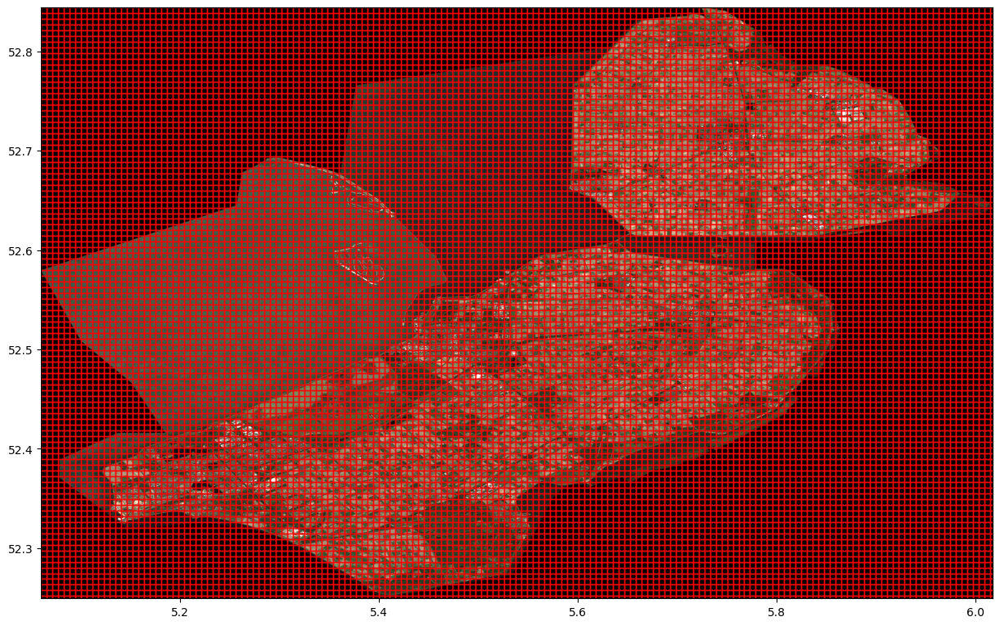

In [16]:
image = rio.open(tif_file)
fig, ax = plt.subplots(figsize=(15,15))
tiles.plot(facecolor="none", edgecolor='red', ax=ax)
show(image, ax=ax);

Notice that the polygons are generated for empty (black) regions as well. Using our model to predict on blank regions seems computationally wasteful.

Instead, we can get the intersection between:
- the Flevoland boundary polygon and
- the 64 x 64 grid tiles.

To do this, we use GeoPandas `.sjoin()` function. We set parameter `predicate='within'` to indicate that we only want the tiles that lie within the district boundary.

[See  more information on GeoPandas sjoin operation here](https://geopandas.org/reference/geopandas.sjoin.html).


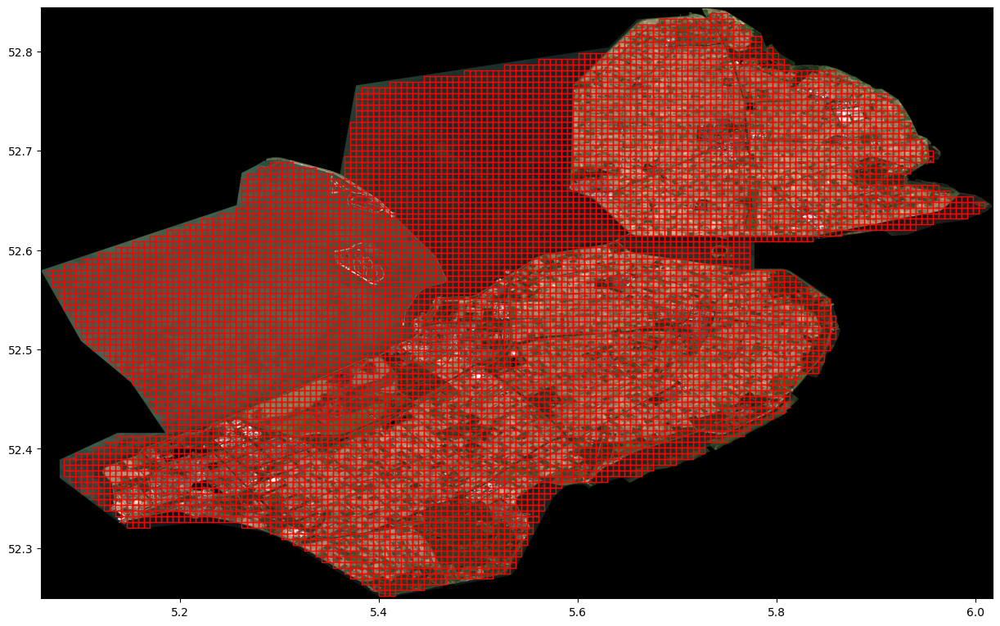

In [17]:
image = rio.open(tif_file)

# Geopandas sjoin function
tiles =gpd.sjoin(tiles, boundary, predicate='within')

fig, ax = plt.subplots(figsize=(15,15))
tiles.plot(facecolor="none", edgecolor='red', ax=ax)
show(image, ax=ax);

## Visualize Single Cropped Image
We can now crop our Sentinel-2 image using the generated grids.

Here, we visualize the Sentinel-2 image cropped using the first tile with the function 'show_crop'

In [18]:
show_crop?

Signature: show_crop(image, shape, title='')
Docstring:
Crops an image based on the polygon shape.
Reference: https://rasterio.readthedocs.io/en/latest/api/rasterio.mask.html#rasterio.mask.mask

Args:
  image (str): Image file path (.tif)
  shape (geometry): The tile with which to crop the image
  title(str): Image title
File:      /media/liganium/Data/Deep Learning For EO/Land Use and Land Cover/LULC_ViT_EuroSAT3B/utils2.py
Type:      function

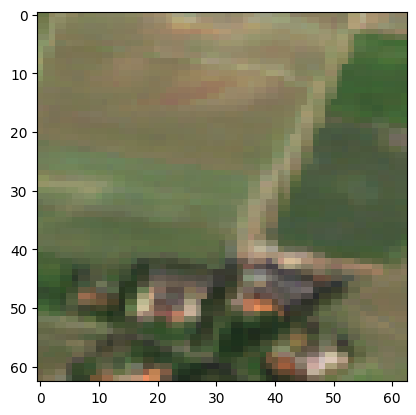

In [19]:
tile_id = 1 # change the tile_id to visualize a different tile
show_crop(tif_file, [tiles.iloc[tile_id]['geometry']])

<a name="lulc-maps"></a>
# Generate Land Use and Land Cover Map
In this section, we will generate our land use and land cover classification map using the trained model from the previous tutorial. Recall that the EuroSAT dataset consists of 10 different LULC classes as listed below.

In [20]:
### LULC Classes : 

classes = [
  'AnnualCrop',
  'Forest',
  'HerbaceousVegetation',
  'Highway',
  'Industrial',
  'Pasture',
  'PermanentCrop',
  'Residential',
  'River',
  'SeaLake'
]

## Load Model trained on EuroSAT
First, load your trained model from './output/best_model.pth'



In [21]:
import torch
from torchvision import models

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model_file = './outputs/best_model.pth'

# Allow VisionTransformer to be loaded safely
torch.serialization.add_safe_globals([models.vision_transformer.VisionTransformer])

# Load the full model directly
model = torch.load(model_file, map_location=device, weights_only=False)
model.eval()

print(f"Model file {model_file} successfully loaded.")


Model file ./outputs/best_model.pth successfully loaded.


Remember in the previous tutorial that we applied a set of data transformations to our test set. Before we run our new images through the model, we'll need to apply these same transformation to our new data as follow.

In [22]:
imagenet_mean, imagenet_std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]

transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(imagenet_mean, imagenet_std)
])

## Model Prediction & LULC Map Generation

Next, let's define a function that:
1. Crops the source image using the 64x64 tile geometry (see the function predict_crop in utils2.py)
2. Generates a prediction for the cropped image using the trained model

In [23]:
predict_crop?

Signature: predict_crop(image, shape, classes, model, transform, show=False)
Docstring:
Generates model prediction using trained model

Args:
  image (str): Image file path (.tiff)
  shape (geometry): The tile with which to crop the image
  classes (list): List of LULC classes
  model (torch.nn.Module): Trained PyTorch model
  transform (callable): Transformation to apply to the image

Return
  str: Predicted label
File:      /media/liganium/Data/Deep Learning For EO/Land Use and Land Cover/LULC_ViT_EuroSAT3B/utils2.py
Type:      function

Let's iterate over every 64x64 px tile and generate model predictions for the corresponding cropped image. Note that we are overwriting each temporary TIFF file to save storage space.

In [46]:
# Commence model prediction
labels = [] # Store predictions
for index in tqdm(range(len(tiles)), total=len(tiles)):
  label = predict_crop(tif_file, [tiles.iloc[index]['geometry']], classes, model, transform)
  labels.append(label)
tiles['pred'] = labels

# Cleanup temporary files
!rm './temp.tif'



  0%|          | 0/9351 [00:00<?, ?it/s]

In [47]:
# Save predictions
output_path = './outputs/{}_preds.geojson'.format(shape_name)
tiles.to_file(output_path, driver="GeoJSON")

tiles.head(3)

,id,geometry,index_right,shapeName,shapeISO,shapeID,shapeGroup,shapeType,pred
284,flevoland-284,"POLYGON ((5.7388 52.83253, 5.7388 52.83828, 5....",3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,PermanentCrop
285,flevoland-285,"POLYGON ((5.74455 52.83253, 5.74455 52.83828, ...",3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,PermanentCrop
286,flevoland-286,"POLYGON ((5.7503 52.83253, 5.7503 52.83828, 5....",3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,AnnualCrop


## Fast Inference

The previous cell took  long time (more than 1hour on my machine) to do inference. Lets find solutions to make it fast.
- Eliminate disk I/O (temp.tif),

- Use all CPU cores for cropping,

- Exploit GPU batching for inference.

This should reduce runtime from hours → minutes, depending on GPU/CPU.

In [24]:
from fast_inference import crop_tile, batch_predict

In [25]:
# ! pip install joblib 

In [26]:
# Step 1: crop in parallel
from joblib import Parallel, delayed

# Limit the number of parallel jobs (e.g., 4 instead of all cores)
n_jobs = 8
images = Parallel(n_jobs=n_jobs, backend="loky")(
    delayed(crop_tile)(tif_file, [geom]) for geom in tiles.geometry
)

# Reduce batch size to fit GPU memory (try 16 or 32 first)
batch_size= 64
labels = batch_predict(images, classes, model, transform, batch_size=batch_size)

tiles['pred'] = labels



In [ ]:
# batch 32 : 44min
# batch 64 : 42min

### Create a custom Dataset and a Dataloader

In [40]:
from torch.utils.data import Dataset, DataLoader
from rasterio.mask import mask

class TileDataset(Dataset):
    """
    Dataset for cropping tiles from a raster (.tif) on-the-fly
    using a GeoDataFrame of polygon geometries.
    """

    def __init__(self, image_path, geoms, transform=None):
        """
        Args:
            image_path (str): Path to raster (.tif).
            geoms (list): List of shapely geometries (e.g. tiles.geometry).
            transform (callable, optional): Transform to apply to each crop (PIL -> Tensor).
        """
        self.image_path = image_path
        self.geoms = geoms
        self.transform = transform

    def __len__(self):
        return len(self.geoms)

    def __getitem__(self, idx):
        geom = [self.geoms[idx]]

        # Open raster for each crop
        # (if this is still slow, we can optimize with rasterio.windows instead of mask)
        with rio.open(self.image_path) as src:
            out_image, _ = mask(src, geom, crop=True)

        # Remove black borders
        _, x_nonzero, y_nonzero = np.nonzero(out_image)
        out_image = out_image[
            :, np.min(x_nonzero):np.max(x_nonzero),
            np.min(y_nonzero):np.max(y_nonzero)
        ]

        # CHW -> HWC for PIL
        out_image = np.moveaxis(out_image, 0, -1).astype(np.uint8)
        img = Image.fromarray(out_image)

        if self.transform:
            img = self.transform(img)

        return img, idx   # return idx so we can map prediction back


# Create dataset
dataset = TileDataset(tif_file, tiles.geometry, transform=transform)

# DataLoader with batching + multiple workers
loader = DataLoader(dataset, batch_size=64, shuffle=False, num_workers=8)

# Inference loop
all_preds = []
model.eval()
device = next(model.parameters()).device

with torch.no_grad():
    for imgs, idxs in loader:
        imgs = imgs.to(device)
        outputs = model(imgs)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)

# Map predictions back to classes
labels = [classes[p] for p in all_preds]
tiles['pred'] = labels


In [41]:
# Save predictions
output_path = './outputs/{}_preds.geojson'.format(shape_name)
tiles.to_file(output_path, driver="GeoJSON")

tiles.head(3)

,id,index_right,shapeName,shapeISO,shapeID,shapeGroup,shapeType,pred,geometry,color
0,flevoland-284,3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,PermanentCrop,"POLYGON ((5.7388 52.83253, 5.7388 52.83828, 5....",#7fff00
1,flevoland-285,3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,PermanentCrop,"POLYGON ((5.74455 52.83253, 5.74455 52.83828, ...",#7fff00
2,flevoland-286,3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,AnnualCrop,"POLYGON ((5.7503 52.83253, 5.7503 52.83828, 5....",#90ee90


## Visualize Interactive LULC Map
Lastly, we show you how to generate an interactive LULC map using Folium.

Let's start by loading the resulting predictions.

In [42]:
filepath = './outputs/{}_preds.geojson'.format(shape_name)
tiles = gpd.read_file(filepath)
tiles.head(3)

,id,index_right,shapeName,shapeISO,shapeID,shapeGroup,shapeType,pred,color,geometry
0,flevoland-284,3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,PermanentCrop,#7fff00,"POLYGON ((5.7388 52.83253, 5.7388 52.83828, 5...."
1,flevoland-285,3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,PermanentCrop,#7fff00,"POLYGON ((5.74455 52.83253, 5.74455 52.83828, ..."
2,flevoland-286,3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,AnnualCrop,#90ee90,"POLYGON ((5.7503 52.83253, 5.7503 52.83828, 5...."


In [43]:
# We map each class to a corresponding color
colors = {
  'AnnualCrop' : 'lightgreen',
  'Forest' : 'forestgreen',
  'HerbaceousVegetation' : 'yellowgreen',
  'Highway' : 'gray',
  'Industrial' : 'red',
  'Pasture' : 'mediumseagreen',
  'PermanentCrop' : 'chartreuse',
  'Residential' : 'magenta',
  'River' : 'dodgerblue',
  'SeaLake' : 'blue'
}

tiles['color'] = tiles["pred"].apply(
  lambda x: cl.to_hex(colors.get(x))
)
tiles.head(2)

,id,index_right,shapeName,shapeISO,shapeID,shapeGroup,shapeType,pred,color,geometry
0,flevoland-284,3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,PermanentCrop,#7fff00,"POLYGON ((5.7388 52.83253, 5.7388 52.83828, 5...."
1,flevoland-285,3,Flevoland,NL-FL,6811986B59803137683520,NLD,ADM1,PermanentCrop,#7fff00,"POLYGON ((5.74455 52.83253, 5.74455 52.83828, ..."


### Display the map

In [44]:
# Instantiate map centered on the centroid
map = folium.Map(location=[centroid[1], centroid[0]], zoom_start=10)

# Add Google Satellite basemap
folium.TileLayer(
      tiles = 'https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}',
      attr = 'Google',
      name = 'Google Satellite',
      overlay = True,
      control = True
).add_to(map)

# Add LULC Map with legend
legend_txt = '<span style="color: {col};">{txt}</span>'
for label, color in colors.items():

  # Specify the legend color
  name = legend_txt.format(txt=label, col=color)
  feat_group = folium.FeatureGroup(name=name)

  # Add GeoJSON to feature group
  subtiles = tiles[tiles.pred==label]
  if len(subtiles) > 0:
    folium.GeoJson(
        subtiles,
        style_function=lambda feature: {
          'fillColor': feature['properties']['color'],
          'color': 'black',
          'weight': 1,
          'fillOpacity': 0.5,
        },
        name='LULC Map'
    ).add_to(feat_group)
    map.add_child(feat_group)

folium.LayerControl().add_to(map)
map

In [45]:
# Save as HTML
map.save("./outputs/lulc_map_flevoland.html")
print("✅ Map saved as ./outputs/lulc_map_flevoland.html")


✅ Map saved as ./outputs/lulc_map_flevoland.html


### Save as png

In [33]:
# ! pip install html2image


In [37]:
from html2image import Html2Image


# Convert HTML → PNG
hti = Html2Image()
hti.screenshot(
    html_file="./outputs/lulc_map_flevoland.html",
    save_as="lulc_map_flevoland.png",
    size=(1200, 800)
)
print("✅ Map saved as lulc_map_flevoland.png")


✅ Map saved as lulc_map_flevoland.png


1541948 bytes written to file /media/liganium/Data/Deep Learning For EO/Land Use and Land Cover/LULC_ViT_EuroSAT3B/lulc_map_flevoland.png
